
# *NETFLIX* 

## <span style="color:green">Perform Exploratory Data Analysis (EDA)</span>
## <span style="color:green">Using</span>

## 1. Pandas
- **Purpose**: Data manipulation and analysis.
- **Functions for EDA**:
  - `df.describe()`: Summary statistics.
  - `df.info()`: Data types and missing values.
  - `df.isnull().sum()`: Count missing values.
  - `df.corr()`: Correlation matrix.
- **Installation**: `pip install pandas`

## 2. NumPy
- **Purpose**: Numerical operations.
- **Functions for EDA**:
  - `np.mean()`,`np.median()`, `np.std()`: Calculate basic statistics.
- **Installation**: `pip install numpy`

## 3. Matplotlib
- **Purpose**: creating static, interactive, and publication-quality visualizations.
- **Functions for EDA**:
  - `plt.plot()`: Create line plots.
  - `plt.bar()`: create bar charts.
  - `plt.pie()`: create pie charts.
  - `plt.hist()`: Create histograms.
  - `plt.title()`, `plt.xlabel()`, `plt.ylabel()`: Customize chart titles and axis labels.
  - **Installation**: `pip install matplotlib`

    
## 4. Seaborn
- **Purpose**: Statistical data visualization.
- **Functions for EDA**:
  - `sns.heatmap()`: Correlation heatmaps.
  - `sns.boxplot()`: Box plots.
  - `sns.jointplot()`: Check correlation between two variables.
  - `sns.lineplot()`: Draw lineplot.
- **Installation**: `pip install seaborn

## 5. Plotly
-  **Purpose**: Interactive plotting library for creating web-based, dynamic visualizations.
-  **Functions for EDA**:
   - `go.Figure()`: Create figures for custom visualizations.
   - `px.choropleth()`: Plotly function used to create geographic choropleth maps.
   - `update_layout()`: Customize plot appearance and layout.
- **Installation**: `pip install plotly`

## 6. import warnings
 - **it helps suppress unnecessary warnings to keep the analysis output clean and focused.**






import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

In [66]:
df=pd.read_csv("netflix_train.csv")

In [68]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


## Show shape

In [8]:
df.shape

(8807, 12)

## Find Information

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


## Check the missing values

In [14]:
df.isnull().sum()

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64

In [16]:
df.isnull().sum()/len(df)*100

show_id          0.000000
type             0.000000
title            0.000000
director        29.908028
cast             9.367549
country          9.435676
date_added       0.113546
release_year     0.000000
rating           0.045418
duration         0.034064
listed_in        0.000000
description      0.000000
dtype: float64

# fill the null values

In [19]:
df["director"]=df["director"].fillna(df["director"].mode()[0])

In [21]:
df["country"]=df["country"].fillna(df["country"].mode()[0])
df["cast"]=df["cast"].fillna(df["cast"].mode()[0])


In [23]:
df["rating"]=df["rating"].fillna(df["rating"].mode()[0])
df["duration"]=df["duration"].fillna(df["duration"].mode()[0])
df["date_added"]=df["date_added"].fillna(df["date_added"].mode()[0])

In [25]:
df.isnull().sum()/len(df)*100

show_id         0.0
type            0.0
title           0.0
director        0.0
cast            0.0
country         0.0
date_added      0.0
release_year    0.0
rating          0.0
duration        0.0
listed_in       0.0
description     0.0
dtype: float64

# Rename Columns

In [28]:
df.rename(columns={"date_added":"year1"},inplace=True)

In [30]:
df.rename(columns={"listed_in":"genres"},inplace=True)

# Change Dtypes

In [33]:
df["year1"] = pd.to_datetime(df["year1"],errors="coerce")
df["date_added"] = df["year1"].dt.day
df["month_added"]=df["year1"].dt.month_name()
df["year_added"] = df["year1"].dt.year

In [35]:
df["date_added"]=df["date_added"].fillna(0).astype("int64")
df["year_added"]=df["year_added"].fillna(0).astype("int64")
df["month_added"]=df["month_added"].fillna(df["month_added"].mode()[0])

## Display the first few rows of the dataset to understand its structure.

In [38]:
df.head()

,show_id,type,title,director,cast,country,year1,release_year,rating,duration,genres,description,date_added,month_added,year_added
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,David Attenborough,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",25,September,2021
1,s2,TV Show,Blood & Water,Rajiv Chilaka,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",24,September,2021
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",United States,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,24,September,2021
3,s4,TV Show,Jailbirds New Orleans,Rajiv Chilaka,David Attenborough,United States,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",24,September,2021
4,s5,TV Show,Kota Factory,Rajiv Chilaka,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,24,September,2021


# Check dupliicates Values 

In [41]:
df.duplicated().sum()

np.int64(0)

# delete Columns

In [44]:
df.drop(columns="description",inplace=True)

In [46]:
df.to_csv("Netflix_Movies.csv")

# Chekiing unique Values

In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       8807 non-null   object        
 1   type          8807 non-null   object        
 2   title         8807 non-null   object        
 3   director      8807 non-null   object        
 4   cast          8807 non-null   object        
 5   country       8807 non-null   object        
 6   year1         8719 non-null   datetime64[ns]
 7   release_year  8807 non-null   int64         
 8   rating        8807 non-null   object        
 9   duration      8807 non-null   object        
 10  genres        8807 non-null   object        
 11  date_added    8807 non-null   int64         
 12  month_added   8807 non-null   object        
 13  year_added    8807 non-null   int64         
dtypes: datetime64[ns](1), int64(3), object(10)
memory usage: 963.4+ KB


In [51]:
df["month_added"]=df["month_added"].fillna(df["month_added"].mode()[0])

In [53]:
df["type"].unique()

array(['Movie', 'TV Show'], dtype=object)

In [55]:
countryList = set()

for country in df['country']:
    d = country.split(",")
    if len(d) > 1:
        for i in d:
            countryList.add(i.strip())
    else:
        countryList.add(country)

In [57]:
countryList

{'',
 'Afghanistan',
 'Albania',
 'Algeria',
 'Angola',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Bermuda',
 'Botswana',
 'Brazil',
 'Bulgaria',
 'Burkina Faso',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cayman Islands',
 'Chile',
 'China',
 'Colombia',
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czech Republic',
 'Denmark',
 'Dominican Republic',
 'East Germany',
 'Ecuador',
 'Egypt',
 'Ethiopia',
 'Finland',
 'France',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Guatemala',
 'Hong Kong',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy',
 'Jamaica',
 'Japan',
 'Jordan',
 'Kazakhstan',
 'Kenya',
 'Kuwait',
 'Latvia',
 'Lebanon',
 'Liechtenstein',
 'Lithuania',
 'Luxembourg',
 'Malawi',
 'Malaysia',
 'Malta',
 'Mauritius',
 'Mexico',
 'Mongolia',
 'Montenegro',
 'Morocco',
 'Mozambique',
 'Namibia',
 'Nepal',
 'Netherlands',
 'New Zealand',
 'Nicaragua',
 'Nigeria',
 'Nor


# Create visualizations to represent the distribution of content over different genres.

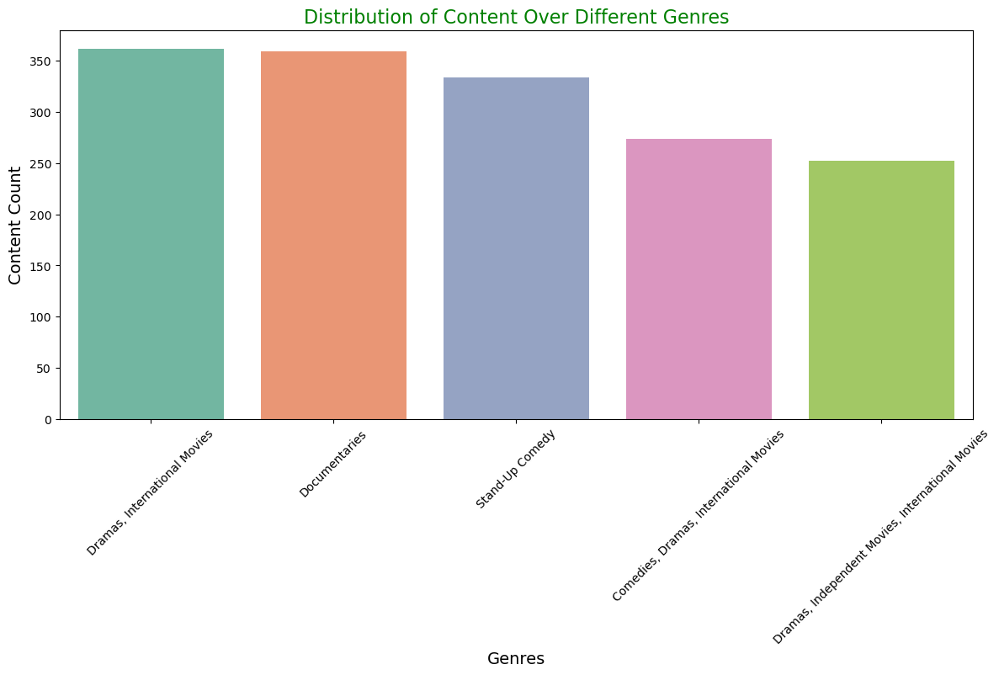

In [60]:
genre_counts = df['genres'].value_counts().head(5)

# Bar plot for distribution of content over genres
plt.figure(figsize=(14,6))
sns.barplot(x=genre_counts.index, y=genre_counts.values, palette="Set2")

# Title and labels
plt.title('Distribution of Content Over Different Genres',fontsize=16,color="green")
plt.xlabel('Genres',fontsize=14)
plt.ylabel('Content Count',fontsize=14)
plt.xticks(rotation=45)
plt.show()


# Visualize the distribution of content across release years.

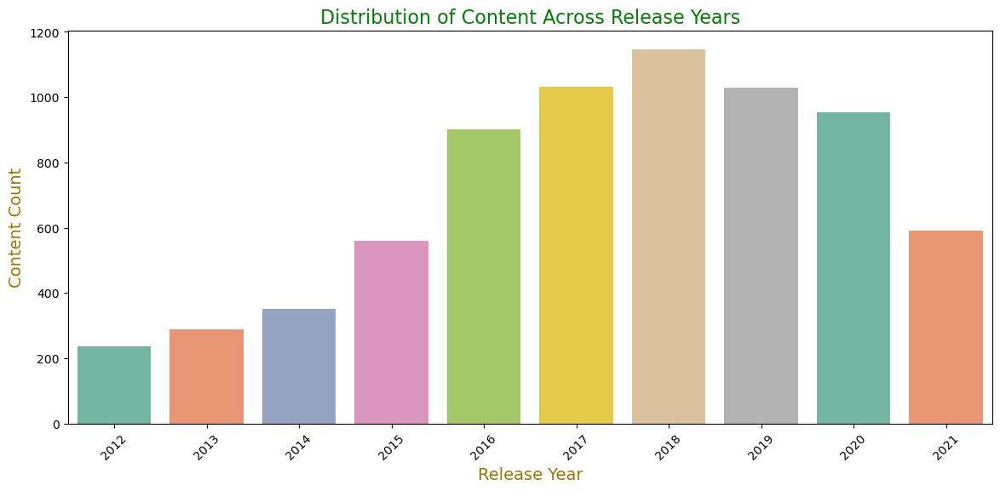

In [62]:
release_year_counts = df['release_year'].value_counts().head(10)
plt.figure(figsize=(14, 6))
sns.barplot(x=release_year_counts.index, y=release_year_counts.values, palette="Set2")
# Title and labels
plt.title('Distribution of Content Across Release Years',color="green",fontsize=16)
plt.xlabel('Release Year',fontsize=14,color="#9e7402")
plt.ylabel('Content Count',fontsize=14,color="#9e7402")
plt.xticks(rotation=45)
plt.show()


# Explore the geographical distribution of content (if applicable).

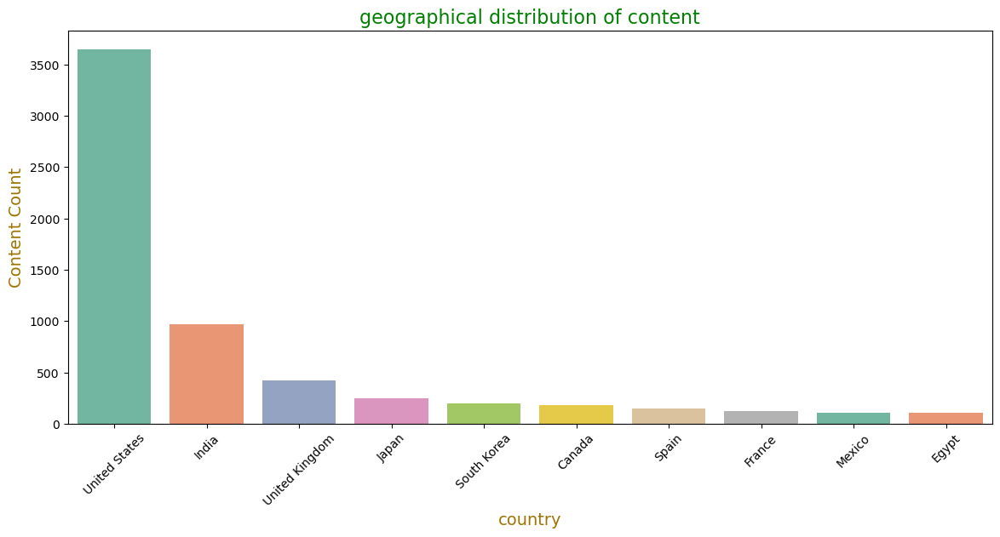

In [65]:
country_counts = df['country'].value_counts().head(10)

plt.figure(figsize=(14,6))
sns.barplot(x=country_counts.index, y=country_counts.values, palette="Set2")

# Title and labels
plt.title('geographical distribution of content',color="green",fontsize=16)
plt.xlabel('country',fontsize=14,color="#9e7402")
plt.ylabel('Content Count',fontsize=14,color="#9e7402")
plt.xticks(rotation=45)
plt.show()

# Perform time series analysis to identify trends and patterns over time.

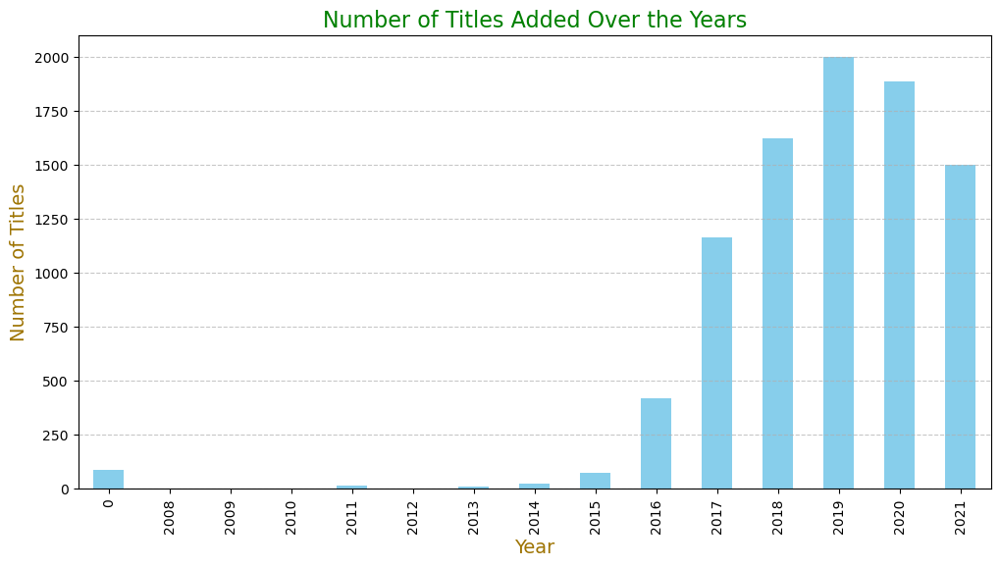

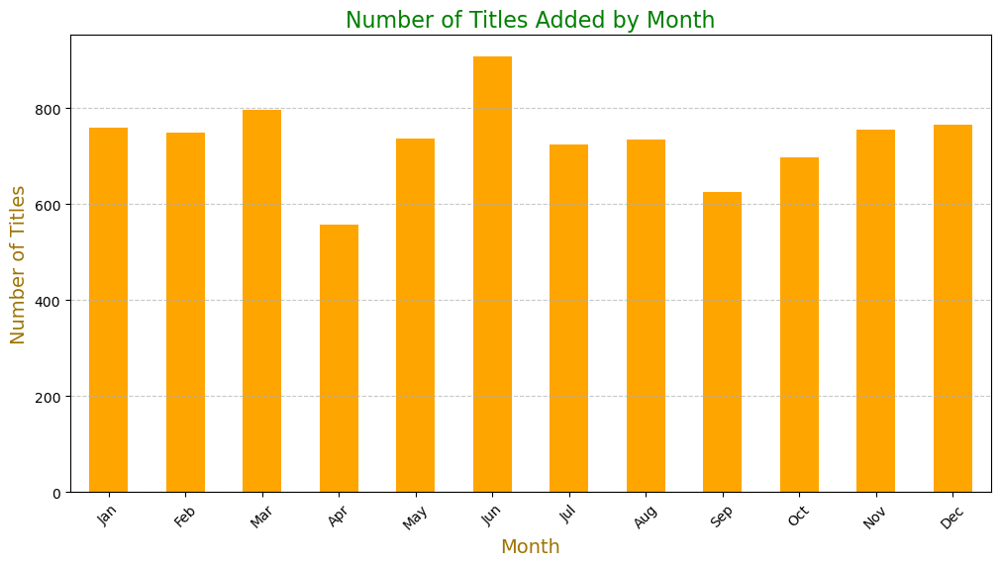

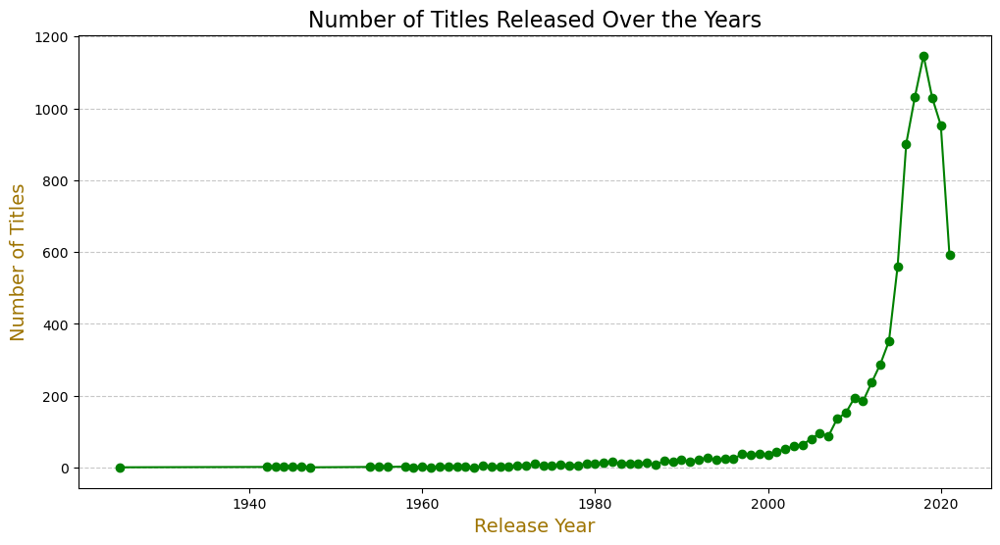

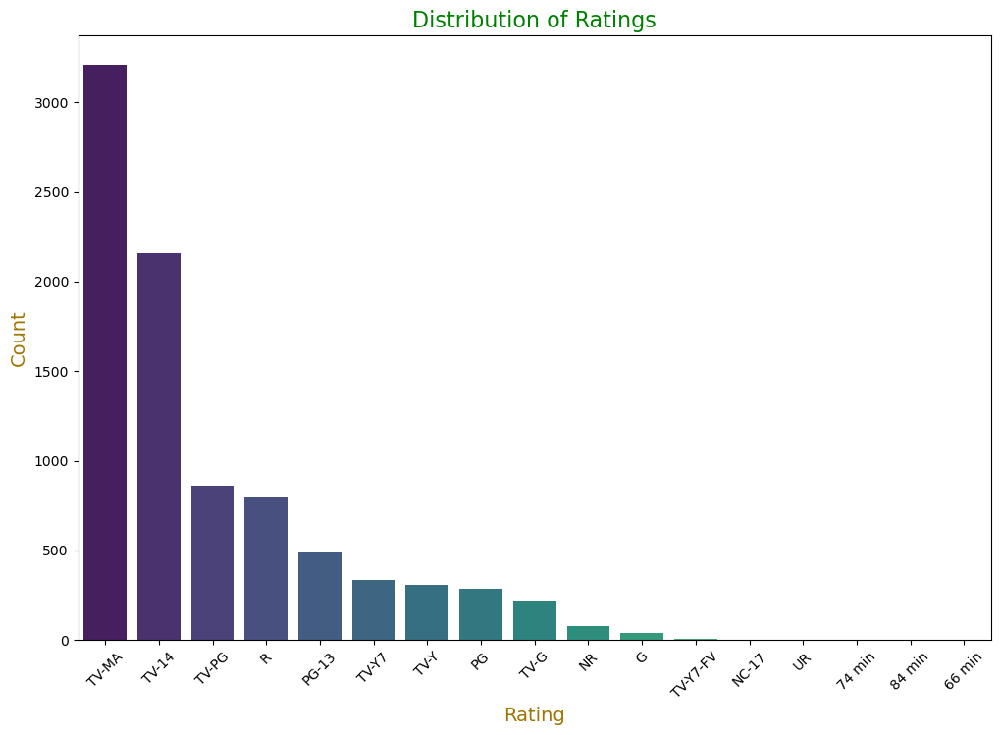

In [68]:
# Aggregating data to analyze trends over years
trend_by_year = df['year_added'].value_counts().sort_index()

# Plot the trend over years
plt.figure(figsize=(12, 6))
trend_by_year.plot(kind='bar', color='skyblue')
plt.title('Number of Titles Added Over the Years',fontsize=16,color="green")
plt.xlabel('Year',fontsize=14,color="#9e7402")
plt.ylabel('Number of Titles',fontsize=14,color="#9e7402")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Analyzing trends by month
trend_by_month = df.groupby('month_added').size()

# Plot the trend over months
plt.figure(figsize=(12, 6))
trend_by_month.plot(kind='bar', color='orange')
plt.title('Number of Titles Added by Month',fontsize=16,color="green")
plt.xlabel('Month',fontsize=14,color="#9e7402")
plt.ylabel('Number of Titles',fontsize=14,color="#9e7402")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(range(12), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.show()

# Analyzing trends in release years
release_year_trend = df['release_year'].value_counts().sort_index()

# Plot the trend for release years
plt.figure(figsize=(12, 6))
release_year_trend.plot(kind='line', marker='o', color='green')
plt.title('Number of Titles Released Over the Years',fontsize=16)
plt.xlabel('Release Year',fontsize=14,color="#9e7402")
plt.ylabel('Number of Titles',fontsize=14,color="#9e7402")
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Analyze the distribution of ratings over time
plt.figure(figsize=(12, 8))
sns.countplot(data=df, x='rating', order=df['rating'].value_counts().index, palette='viridis')
plt.title('Distribution of Ratings',fontsize=16,color="green")
plt.xlabel('Rating',fontsize=14,color="#9e7402")
plt.ylabel('Count',fontsize=14,color="#9e7402")
plt.xticks(rotation=45)
plt.show()



# Analyze the distribution of content ratings.

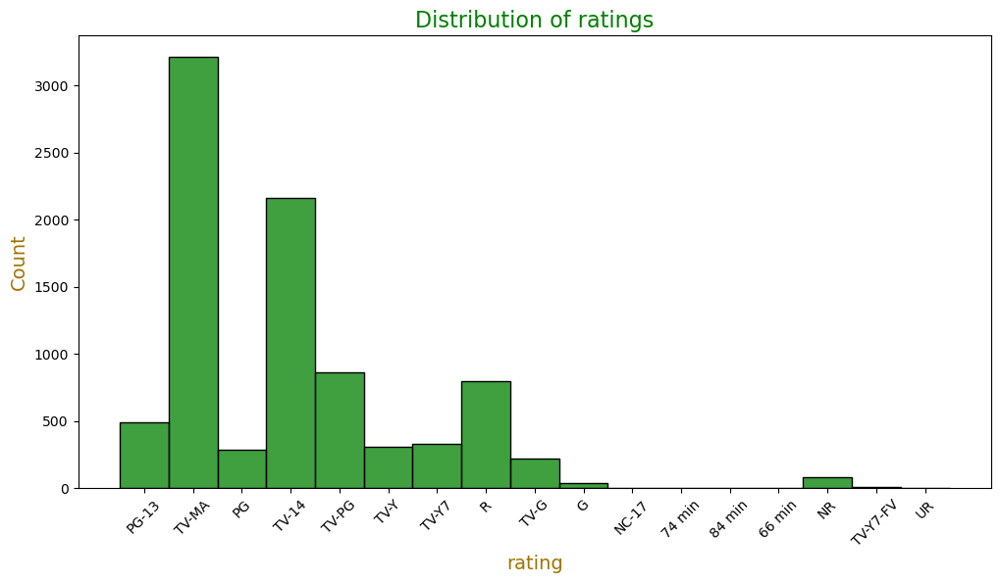

In [71]:
plt.figure(figsize=(12, 6))
sns.histplot(df['rating'],color='g')
plt.title("Distribution of ratings",color="green",fontsize=16)
plt.xlabel("rating",fontsize=14,color="#9e7402")
plt.ylabel("Count",fontsize=14,color="#9e7402")
plt.xticks(rotation=45)
# # Display the plot
plt.show()

# Content Analysis - Part 2:
# Explore the length of movies or episodes and identify any trends.

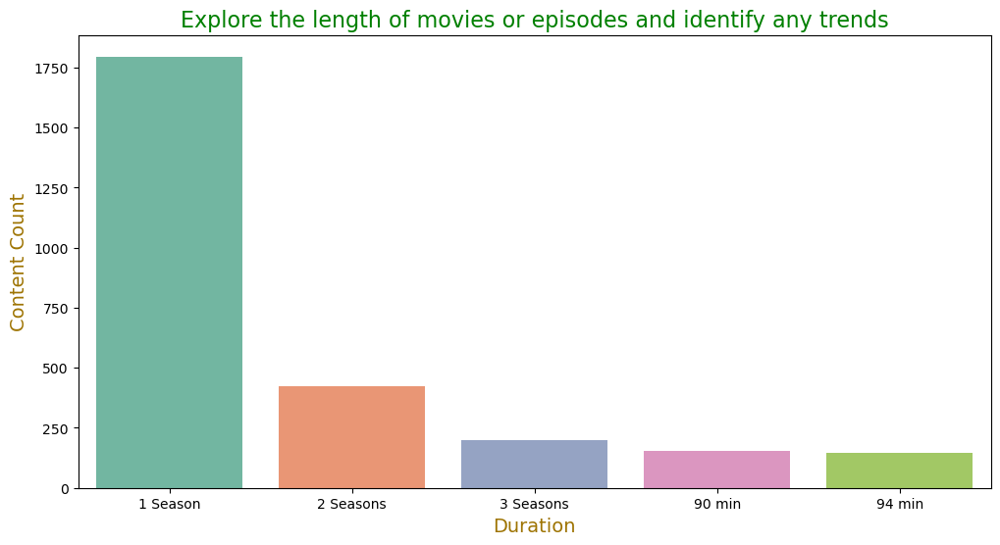

In [73]:
duration_counts = df['duration'].value_counts().head(5)
plt.figure(figsize=(12, 6))
sns.barplot(x=duration_counts.index, y=duration_counts.values, palette="Set2")
# Title and labels
plt.title('Explore the length of movies or episodes and identify any trends',fontsize=16,color="green")
plt.xlabel('Duration',fontsize=14,color="#9e7402")
plt.ylabel('Content Count',fontsize=14,color="#9e7402")
plt.show()


# Identify and present top-rated movies or TV shows based on user ratings.

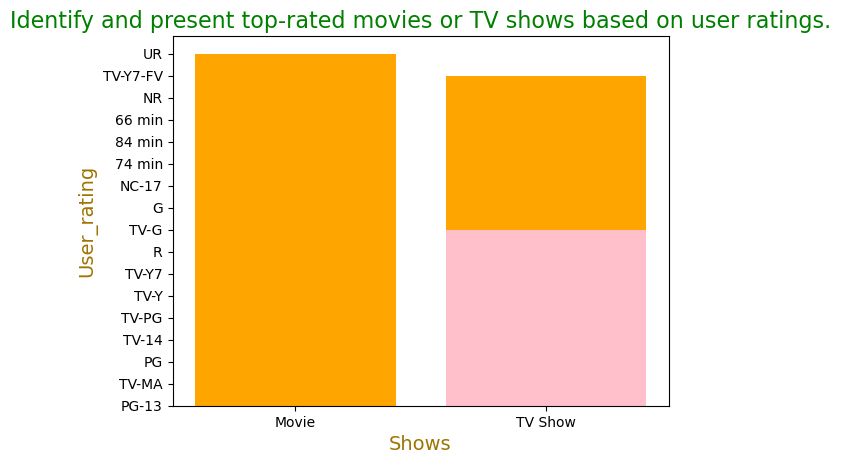

In [76]:
plt.bar(df["type"],df["rating"],color=["orange","pink"])
plt.title("Identify and present top-rated movies or TV shows based on user ratings.",fontsize=16,color="green")
plt.xlabel("Shows",fontsize=14,color="#9e7402")
plt.ylabel("User_rating",fontsize=14,color="#9e7402")
plt.show()

## Genre Trends:

### Analyze trends in the popularity of different genres over time.

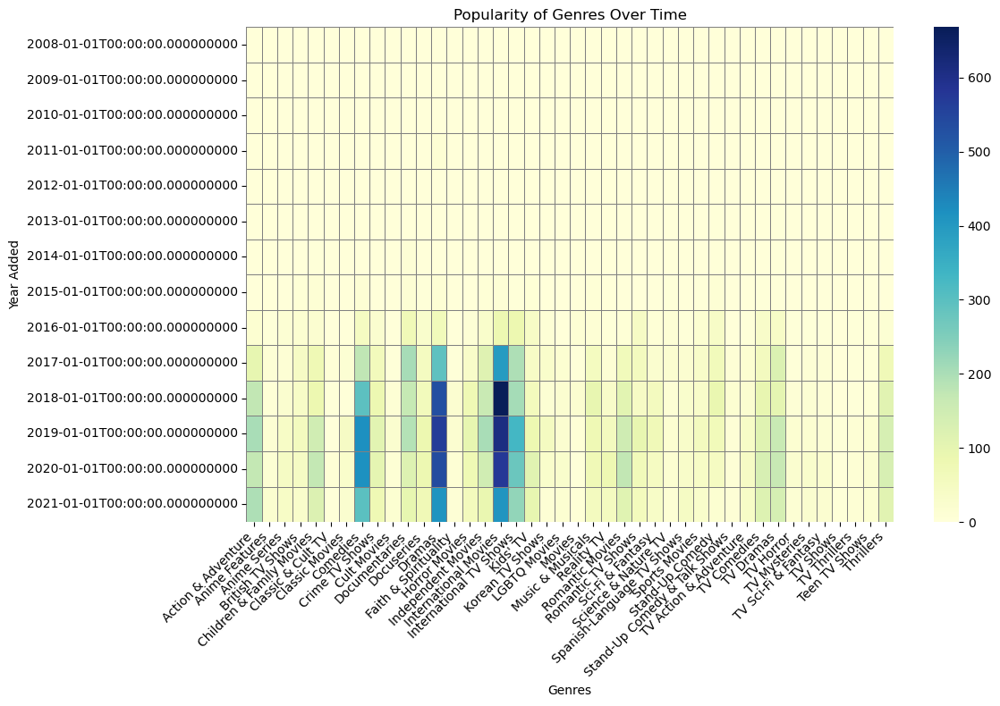

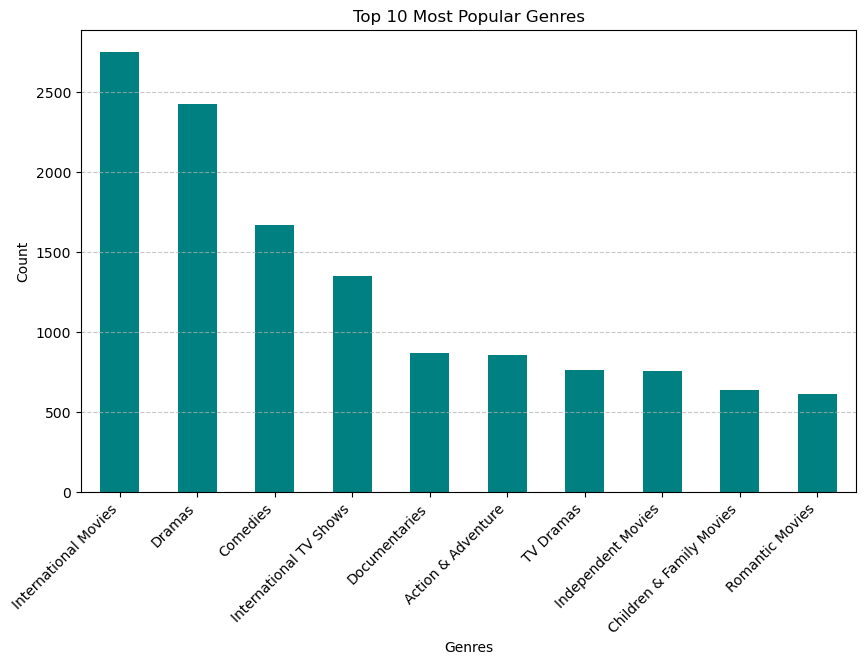

In [81]:
df['year1'] = pd.to_datetime(df['year1'], errors='coerce')

# Extract year and month for analysis
df['year_added'] = pd.to_datetime(df['year_added'], format='%Y', errors='coerce')
df['month_added'] = pd.Categorical(df['month_added'], categories=[
    'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], ordered=True)

# Split genres into separate rows for analysis
df_exploded = df.assign(genres=df['genres'].str.split(", ")).explode('genres')

# Count the number of titles per genre over time
genre_trend = df_exploded.groupby(['year_added', 'genres']).size().reset_index(name='count')

# Pivot the data for heatmap visualization
heatmap_data = genre_trend.pivot(index='year_added', columns='genres', values='count').fillna(0)

# Plot a heatmap to visualize genre popularity trends over time
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', linewidths=0.5, linecolor='gray')
plt.title('Popularity of Genres Over Time')
plt.xlabel('Genres')
plt.ylabel('Year Added')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Analyze the top genres overall
top_genres = df_exploded['genres'].value_counts().head(10)

# Plot the top genres
plt.figure(figsize=(10, 6))
top_genres.plot(kind='bar', color='teal')
plt.title('Top 10 Most Popular Genres')
plt.xlabel('Genres')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



# Further explore the distribution of content across different countries and regions.

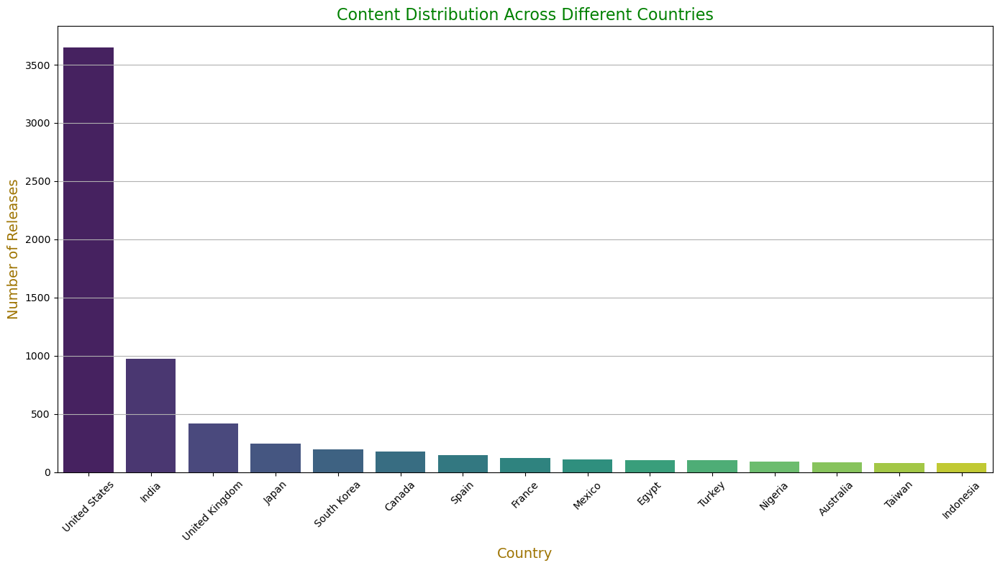

In [83]:
# Step 1: Count the number of content releases per country
country_counts = df['country'].value_counts().head(15)
# Step 2: Plot the distribution of content across countries
plt.figure(figsize=(14, 8))
sns.barplot(x=country_counts.index, y=country_counts.values, palette='viridis')
plt.title('Content Distribution Across Different Countries', fontsize=16,color="green")
plt.xlabel('Country', fontsize=14,color="#9e7402")
plt.ylabel('Number of Releases', fontsize=14,color="#9e7402")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()



In [84]:
df.head()

,show_id,type,title,director,cast,country,year1,release_year,rating,duration,genres,date_added,month_added,year_added
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,David Attenborough,United States,2021-09-25,2020,PG-13,90 min,Documentaries,25,September,2021-01-01
1,s2,TV Show,Blood & Water,Rajiv Chilaka,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",24,September,2021-01-01
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",United States,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",24,September,2021-01-01
3,s4,TV Show,Jailbirds New Orleans,Rajiv Chilaka,David Attenborough,United States,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV",24,September,2021-01-01
4,s5,TV Show,Kota Factory,Rajiv Chilaka,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",24,September,2021-01-01


## Correlation Analysis:
### Investigate potential correlations between variables (e.g., ratings and duration).

In [86]:
df["rating"].unique()

array(['PG-13', 'TV-MA', 'PG', 'TV-14', 'TV-PG', 'TV-Y', 'TV-Y7', 'R',
       'TV-G', 'G', 'NC-17', '74 min', '84 min', '66 min', 'NR',
       'TV-Y7-FV', 'UR'], dtype=object)

In [87]:
df["month_added"].unique()

['September', 'August', 'July', 'June', 'May', ..., 'February', 'January', 'December', 'November', 'October']
Length: 12
Categories (12, object): ['January' < 'February' < 'March' < 'April' ... 'September' < 'October' < 'November' < 'December']

In [88]:
df

,show_id,type,title,director,cast,country,year1,release_year,rating,duration,genres,date_added,month_added,year_added
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,David Attenborough,United States,2021-09-25,2020,PG-13,90 min,Documentaries,25,September,2021-01-01
1,s2,TV Show,Blood & Water,Rajiv Chilaka,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",24,September,2021-01-01
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",United States,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",24,September,2021-01-01
3,s4,TV Show,Jailbirds New Orleans,Rajiv Chilaka,David Attenborough,United States,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV",24,September,2021-01-01
4,s5,TV Show,Kota Factory,Rajiv Chilaka,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",24,September,2021-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,2019-11-20,2007,R,158 min,"Cult Movies, Dramas, Thrillers",20,November,2019-01-01
8803,s8804,TV Show,Zombie Dumb,Rajiv Chilaka,David Attenborough,United States,2019-07-01,2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies",1,July,2019-01-01
8804,s8805,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,2019-11-01,2009,R,88 min,"Comedies, Horror Movies",1,November,2019-01-01
8805,s8806,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,2020-01-11,2006,PG,88 min,"Children & Family Movies, Comedies",11,January,2020-01-01


In [89]:
# Initialize LabelEncoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
col=["rating","month_added"]      # Columns to encode (should be categorical)
for i in col:                     # Apply LabelEncoder only to categorical columns
   df[i]=le.fit_transform(df[i])


## Check and handling outliers

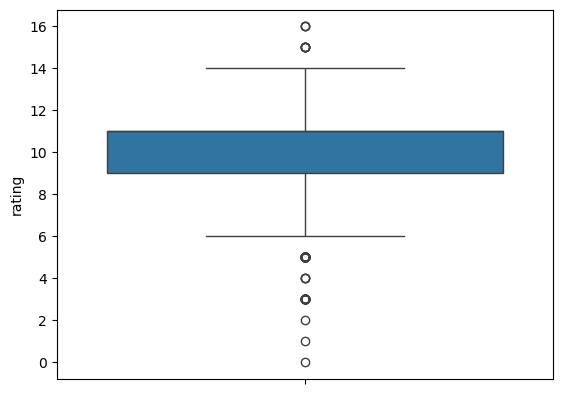

In [99]:
sns.boxplot(df['rating'])
plt.show()

In [101]:


# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df['rating'].quantile(0.25)
Q3 = df['rating'].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Determine the lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Clip values outside the bounds
df['rating'] = df['rating'].clip(lower=lower_bound, upper=upper_bound)




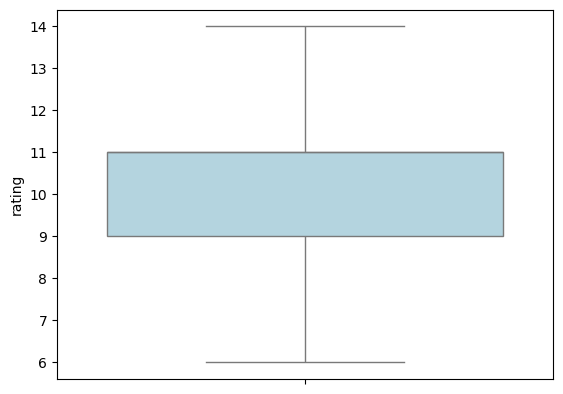

In [103]:
sns.boxplot(df['rating'],color="lightblue")
plt.show()

### Check correlation 

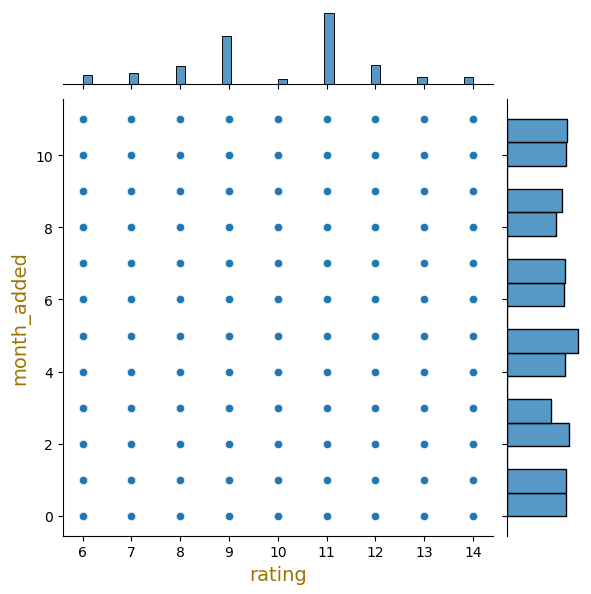

In [106]:
sns.jointplot(x="rating",y="month_added",data=df)

plt.xlabel("rating",fontsize=14,color="#9e7402")
plt.ylabel("month_added",fontsize=14,color="#9e7402")
plt.show()

# Evaluate the diversity of content by analyzing the number of unique genres and categories.

Unique Categories in 'genres':
['Documentaries' 'International TV Shows' 'TV Dramas' 'TV Mysteries'
 'Crime TV Shows' 'TV Action & Adventure' 'Docuseries' 'Reality TV'
 'Romantic TV Shows' 'TV Comedies' 'TV Horror' 'Children & Family Movies'
 'Dramas' 'Independent Movies' 'International Movies' 'British TV Shows'
 'Comedies' 'Spanish-Language TV Shows' 'Thrillers' 'Romantic Movies'
 'Music & Musicals' 'Horror Movies' 'Sci-Fi & Fantasy' 'TV Thrillers'
 "Kids' TV" 'Action & Adventure' 'TV Sci-Fi & Fantasy' 'Classic Movies'
 'Anime Features' 'Sports Movies' 'Anime Series' 'Korean TV Shows'
 'Science & Nature TV' 'Teen TV Shows' 'Cult Movies' 'TV Shows'
 'Faith & Spirituality' 'LGBTQ Movies' 'Stand-Up Comedy' 'Movies'
 'Stand-Up Comedy & Talk Shows' 'Classic & Cult TV']

Total Number of Unique Categories: 42

Frequency of Each Category:
genres
International Movies            2752
Dramas                          2427
Comedies                        1674
International TV Shows          1351


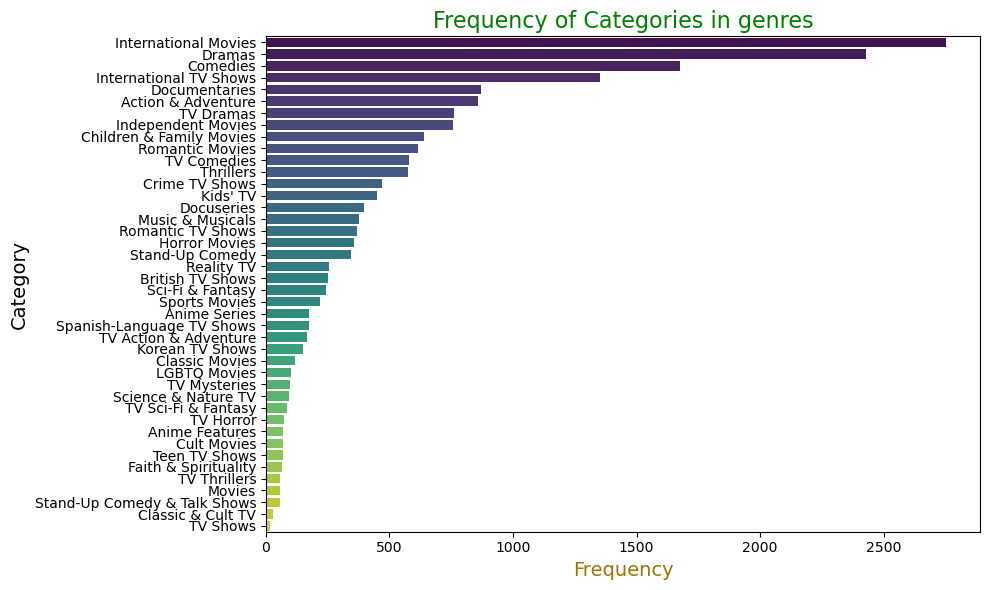

In [108]:
# Step 1: Split and explode the 'genres' column into individual categories
categories = df['genres'].str.split(',').explode().str.strip()

# Step 2: Calculate the number of unique categories
unique_categories = categories.unique()
num_unique_categories = len(unique_categories)

print("Unique Categories in 'genres':")
print(unique_categories)
print(f"\nTotal Number of Unique Categories: {num_unique_categories}")

# Step 3: Calculate the frequency of each category
category_counts = categories.value_counts()

print("\nFrequency of Each Category:")
print(category_counts)

# Step 4: Visualize the frequency of categories
plt.figure(figsize=(10, 6))
sns.barplot(x=category_counts.values, y=category_counts.index, palette="viridis")
plt.title('Frequency of Categories in genres', fontsize=16,color="green")
plt.xlabel('Frequency', fontsize=14,color="#9e7402")
plt.ylabel('Category', fontsize=14)
plt.tight_layout()
plt.show()


# analyze the distribution of content in different Countries.

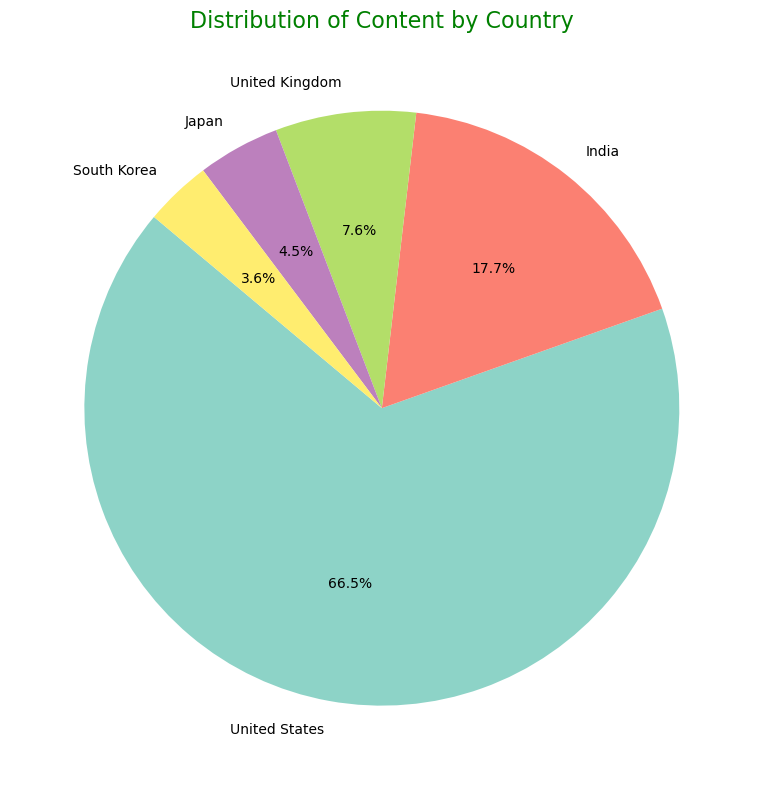

In [112]:
content_distribution = df['country'].value_counts().head(5)
plt.figure(figsize=(8, 8))
content_distribution.plot.pie(autopct='%1.1f%%', startangle=140, cmap='Set3')
plt.title('Distribution of Content by Country', fontsize=16,color="green")
plt.ylabel('')
plt.tight_layout()
plt.show()


# Explore how the characteristics of content (e.g., duration, ratings) have evolved over the years.

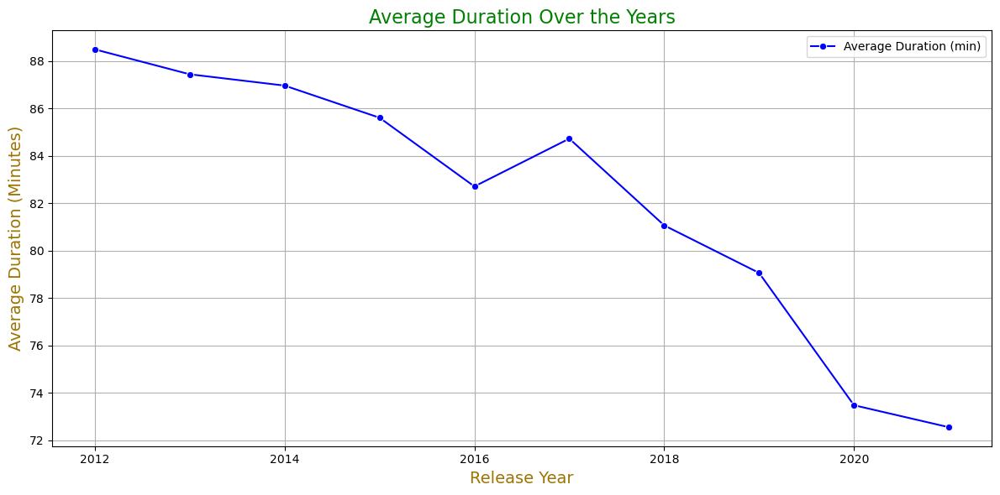

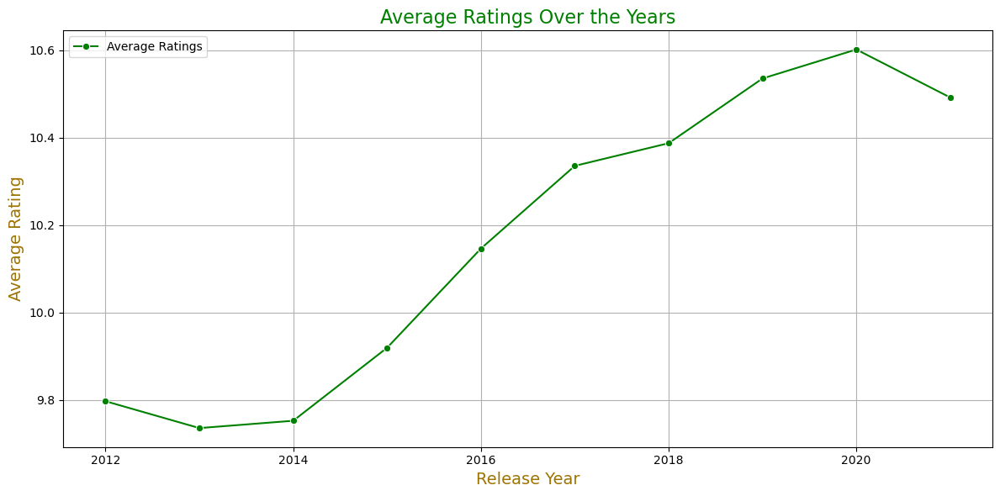

In [115]:
# Step 1: Preprocess the `duration` column
def convert_duration(duration):
    if 'min' in duration:
        return int(duration.replace(' min', ''))
    elif 'Season' in duration:  # Assuming seasons are counted as episodes or full seasons
        return int(duration.split(' ')[0]) * 30  # Assume average episode length = 30 minutes
    return None

df['duration_numeric'] = df['duration'].apply(convert_duration)

# Step 2: Group by `release_year` and calculate the average duration and rating
average_metrics = df.groupby('release_year')[['duration_numeric', 'rating']].mean().tail(10)

# Step 3: Plot trends of average duration and average rating over the years

# Plot Average Duration Over the Years
plt.figure(figsize=(12, 6))
sns.lineplot(x=average_metrics.index, y=average_metrics['duration_numeric'], marker='o', label='Average Duration (min)', color='blue')
plt.title('Average Duration Over the Years', fontsize=16,color="green")
plt.xlabel('Release Year', fontsize=14,color="#9e7402")
plt.ylabel('Average Duration (Minutes)', fontsize=14,color="#9e7402")
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot Average Ratings Over the Years
plt.figure(figsize=(12, 6))
sns.lineplot(x=average_metrics.index, y=average_metrics['rating'], marker='o', label='Average Ratings', color='green')
plt.title('Average Ratings Over the Years', fontsize=16,color="green")
plt.xlabel('Release Year', fontsize=14,color="#9e7402")
plt.ylabel('Average Rating', fontsize=14,color="#9e7402")
plt.grid(True)
plt.tight_layout()
plt.show()


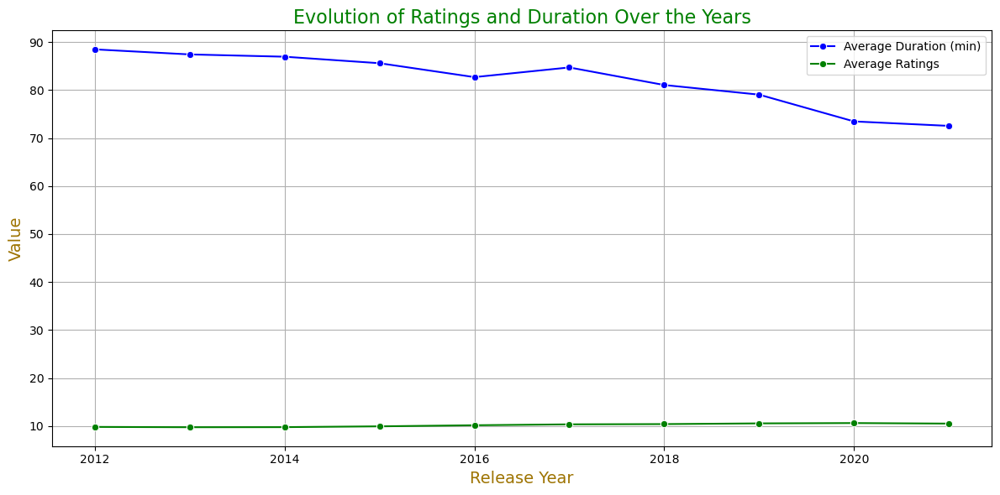

In [116]:
# Step 5: Combine ratings and duration in one plot
plt.figure(figsize=(12, 6))
sns.lineplot(x=average_metrics.index, y=average_metrics['duration_numeric'], marker='o', label='Average Duration (min)', color='blue')
sns.lineplot(x=average_metrics.index, y=average_metrics['rating'], marker='o', label='Average Ratings', color='green')
plt.title('Evolution of Ratings and Duration Over the Years', fontsize=16,color="green")
plt.xlabel('Release Year', fontsize=14,color="#9e7402")
plt.ylabel('Value', fontsize=14,color="#9e7402")
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

# Investigate whether certain genres or types of content are more popular among users.

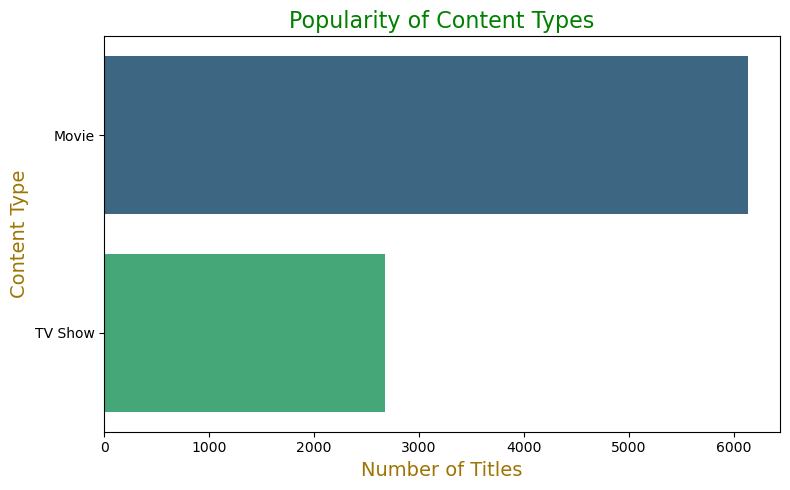

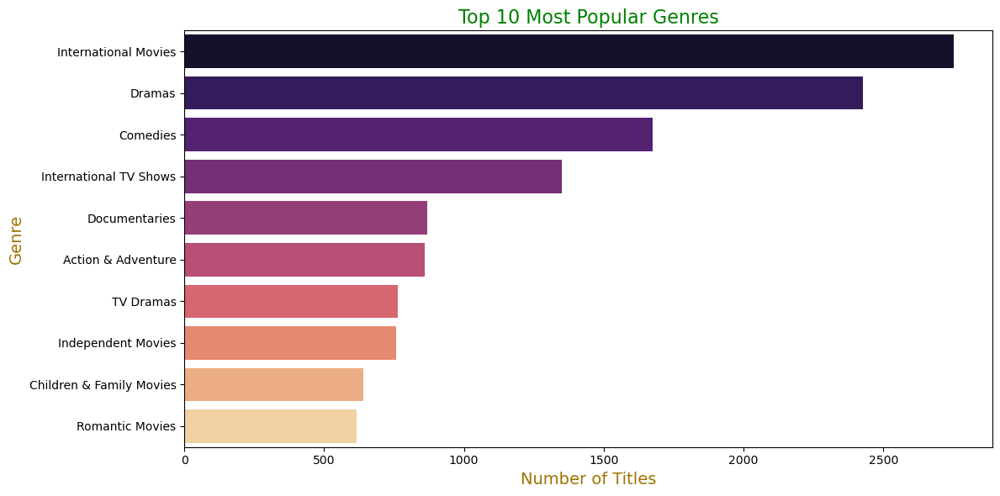

In [120]:
# Step 1: Count the popularity of each type of content
type_counts = df['type'].value_counts()

# Step 2: Split genres and count the popularity of each genre
genres = df['genres'].str.split(', ', expand=True).stack()
genre_counts = genres.value_counts()

# Step 3: Visualize the popularity of types of content
plt.figure(figsize=(8, 5))
sns.barplot(x=type_counts.values, y=type_counts.index, palette="viridis")
plt.title('Popularity of Content Types', fontsize=16,color="green")
plt.xlabel('Number of Titles', fontsize=14,color="#9e7402")
plt.ylabel('Content Type', fontsize=14,color="#9e7402")
plt.tight_layout()
plt.show()

# Step 4: Visualize the popularity of genres
plt.figure(figsize=(12, 6))
sns.barplot(x=genre_counts.values[:10], y=genre_counts.index[:10], palette="magma")
plt.title('Top 10 Most Popular Genres', fontsize=16,color="green")
plt.xlabel('Number of Titles', fontsize=14,color="#9e7402")
plt.ylabel('Genre', fontsize=14,color="#9e7402")
plt.tight_layout()
plt.show()


## Show the content according to country

In [122]:
df

,show_id,type,title,director,cast,country,year1,release_year,rating,duration,genres,date_added,month_added,year_added,duration_numeric
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,David Attenborough,United States,2021-09-25,2020,7,90 min,Documentaries,25,11,2021-01-01,90
1,s2,TV Show,Blood & Water,Rajiv Chilaka,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,11,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries",24,11,2021-01-01,60
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",United States,2021-09-24,2021,11,1 Season,"Crime TV Shows, International TV Shows, TV Act...",24,11,2021-01-01,30
3,s4,TV Show,Jailbirds New Orleans,Rajiv Chilaka,David Attenborough,United States,2021-09-24,2021,11,1 Season,"Docuseries, Reality TV",24,11,2021-01-01,30
4,s5,TV Show,Kota Factory,Rajiv Chilaka,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,11,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",24,11,2021-01-01,60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey J...",United States,2019-11-20,2007,8,158 min,"Cult Movies, Dramas, Thrillers",20,9,2019-01-01,158
8803,s8804,TV Show,Zombie Dumb,Rajiv Chilaka,David Attenborough,United States,2019-07-01,2018,14,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies",1,5,2019-01-01,60
8804,s8805,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,2019-11-01,2009,8,88 min,"Comedies, Horror Movies",1,9,2019-01-01,88
8805,s8806,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,2020-01-11,2006,6,88 min,"Children & Family Movies, Comedies",11,4,2020-01-01,88


In [55]:
country_data = df['country'].value_counts().reset_index()
country_data.columns = ['country', 'count']

# Plot a choropleth map to visualize the number of titles by country
fig = px.choropleth(
    country_data,
    locations='country',
    locationmode='country names',
    color='count',
    hover_name='country',
    color_continuous_scale='Viridis',
    title='Number of Titles by Country'
)

# Customize layout with larger dimensions
fig.update_layout(
    width=1200,
    height=800,
    geo=dict(showframe=False, showcoastlines=True, projection_type='equirectangular'),
    coloraxis_colorbar=dict(title="Number of Titles")
)

fig.show()

## Insights

- Top 5(international movies, drama..) genres in which most content is being distributed.
- Most content release in 2018.
- According to geographical disstribution, the most content count in united states then india.
- In Time series analysis, the most titles count in 2019, month june and rating TV_MA.
- When we analyse the count of ratings , TV_MA take most count of rating.
- The length of movies or episodes mostly take 1 Season.
- The distribution of content,acording to countrywise(United states>india>united kingdom>japan>South korea).
- The time of duration according to release is reduce and rating is up year by year.
- The international movies, drama etc.genres and type Movie content are more popular among users.


In [62]:
df.to_csv("Netflix_Analysis.csv")